In [1]:
import torch, timm, AutoAugment
from torchvision.transforms import transforms
from softdataset import TripletImageDataset, data_split
from original_dataset import OriginalImageDataset, OriginalDataset, data_split, OriginalDataset
from torchvision.transforms import ToTensor, Resize
from torch.utils.data import DataLoader
from torchvision import transforms
import glob, os, random, json
from dataset import TripleDataset
from torch.nn import *
from collections import OrderedDict as OD
from tqdm import tqdm
import numpy as np
from PIL import Image
from sketch_dataset import SketchyImageDataset
from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
import cv2

/home/ubuntu/anaconda3/envs/retrieval/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Inference with Spec72 Dataset (reg_num based accuracy)

In [2]:
def get_fm(fm):
        pool = AvgPool2d((fm.shape[2],fm.shape[3]))
        return torch.reshape(pool(fm), (-1, fm.shape[1]))

def get_dl(path, bs, random = True, trainval_json="", trainval="val"):        
    
    ''' 
    Get path to the images and returns dataloader with transformations applied
    Arguments:

    path - path to the dir with images;
    bs - batch_size;
    random - if False loads train test split json file else randomly mix dataset.      

    '''
    
    transformations = {}   

    transformations['qry'] = transforms.Compose([
                            transforms.Resize((224,224)),
                            # transforms.RandomHorizontalFlip(),
                            # transforms.RandomRotation(90, fill = fill),
                            # transforms.ColorJitter([0.3, 1]),
                            # transforms.GaussianBlur(9, (0.5, 3.0)),
                            # AutoAugment.ImageNetPolicy(),
                            transforms.ToTensor(),
                                                  ])

    transformations['pos'] = transforms.Compose([
        transforms.Resize((224,224)),
        # AutoAugment.ImageNetPolicy(),
        # transforms.RandomRotation(90, fill = fill_sketch),
        # transforms.RandomPerspective(distortion_scale = distortion_scale, p = p, fill = fill_sketch),
        transforms.ToTensor(),
    ])  
    transformations['neg'] = transforms.Compose([
        transforms.Resize((224,224)),
        # AutoAugment.ImageNetPolicy(),
        # transforms.RandomRotation(90, fill = fill_sketch),
        # transforms.RandomPerspective(distortion_scale = distortion_scale, p = p, fill = fill_sketch),
        transforms.ToTensor(),
    ])
    
    # out_path = "data/sketchy_database_256_soft_split_cat.json"
    out_path = "data/spec72.json"
    # out_path = data_split(path, out_path)

    # tr_ds = SketchyImageDataset(data_dir = path, transform_dic=transformations, random=True, trainval_json=out_path, trainval='train', load_images=False)
    # val_ds = SketchyImageDataset(data_dir = path, transform_dic=transformations, random=True, trainval_json=out_path, trainval='val', load_images=False)
    # dataset = SketchyImageDataset(data_dir = path, transform_dic=transformations, random=True, trainval_json=out_path, trainval='test', load_images=False)
    dataset = OriginalImageDataset(data_dir = path, transform_dic=transformations, random=True, trainval_json=out_path, trainval=trainval, load_images=False)
    ds = OriginalDataset(data_dir = path, random=True, trainval_json=out_path, trainval=trainval)
    
    transformations = {}   

    transformations['qry'] = transforms.Compose([transforms.ToTensor()])
    transformations['pos'] = transforms.Compose([transforms.ToTensor()])
    transformations['neg'] = transforms.Compose([transforms.ToTensor()])
    
    # dataset = OriginalImageDataset(data_dir = path, transform_dic=transformations, random=True, load_images=False)
    num_classes = dataset.get_prod_length()
    print(f"The dataset has {num_classes} classes")    
    print(f"Number of test samples: {len(dataset)}")
    
    test_dl = DataLoader(dataset, batch_size=bs, shuffle=True, drop_last=True, num_workers=8)

    return num_classes, dataset, test_dl, ds


def load_checkpoint(checkpoint_path, model_name, pretrained=False, num_classes=None, from_pytorch_lightning=True, init_conv=False):

        ''' 
        
        Loads checkpoint_path from the given path to the directory with the trained model.
        Arguments:
        
        checkpoint_path - path to the dir with the trained model;
        model_name - name of the trained model (name is the same as in the timm library);
        pretrained - creates a model with pretrained weights on ImageNet;
        init_conv - initial convolution layer, default is True;
        from_pytorch_lightning - used to load the trained model from pytorch_lightning.
        If True the model is trained using pytorch_lightning, else with a regular torch library;
        Default is False
        
        '''        
        assert num_classes is not None, "Please set the number of classes in the dataset!"
        
        if from_pytorch_lightning: # for a pytorch_lightning model
            checkpoint = torch.load(checkpoint_path, map_location=device)
            # print(checkpoint['state_dict'].keys())
            if init_conv:                
                base_model = timm.create_model(model_name, pretrained=True, num_classes=num_classes)
                conv_layer = torch.nn.Sequential(torch.nn.Conv2d(3, 3, kernel_size=(3, 3), stride=(1, 1),padding=(1,1), bias=False), 
                 # nn.Conv2d(3, 3, kernel_size=(3, 3), stride=(2, 2),padding=(1,1), bias=False), 
                 # nn.MaxPool2d(kernel_size=(3,3), stride=(2,2), padding=(1,1)),
                 torch.nn.SiLU(inplace=True))
                model = torch.nn.Sequential(conv_layer, base_model) 
                print("Model with init_conv True")
            else:
                model = timm.create_model(model_name, num_classes=num_classes)
                # model.head.fc = Identity()
                print("Model with init_conv False")

            # create new OrderedDict that does not contain `model.` (for the checkpoint from the pytorch_lightning)
            new_state_dict = OD()
            for k, v in checkpoint['state_dict'].items():
                name = k.replace("model.", "") # remove `model.`
                new_state_dict[name] = v
            # load params
            model.load_state_dict(new_state_dict, strict=True)
            print(f"Model {model_name} trained using pytorch lightning checkpoint is successfully loaded!")

        else: # for a regular torch model  
            if pretrained:
                model = timm.create_model(model_name, num_classes=num_classes)
                print(f"Model {model_name} with pretrained weights is successfully loaded!")
            else:
                model = timm.create_model("rexnet_150", num_classes=num_classes)
                state_dict = torch.load(checkpoint_path, map_location=device)
                model.load_state_dict(state_dict)
                # num_features = model.head.fc.in_features
                # model.classifier = Linear(num_features, num_classes) if num_classes > 0 else Identity() 
                print(f"Model {model_name} with the best weights is successfully loaded!")            

        return model
    
def inference(model, dataloader, device):

        ''' 
        
        Inference using trained model and test dataloader.
        Arguments:
        
        model - trained model from the checkpoint (see load_checkpoint function);
        dataloader - test dataloader (see get_dl function);
        device - gpu device.
        
        '''   
        
        ims, poss, negs, pos_scores, neg_scores, fms_ims_all, top_vals, scores, fms_poss_all, fms_negs_all,  classes_all, top_inds, top_r_list, pred_lbls_all = [], [], [], [], [], [], [], [], [], [], [], [], [], []
        cos = torch.nn.CosineSimilarity(dim=1, eps=1e-6)
        model.to(device)
        model.eval()
        model.head = Identity()
        
        print("Obtaining embeddings...")        
        for i, batch_all in tqdm(enumerate(dataloader)):
            # if i == 1:
            #     break
            ims_all, poss_all, negs_all, clss_all, regs_all = batch_all['qry'], batch_all['pos'][0], batch_all['neg'][0], batch_all['cat_idx'], batch_all['prod_idx']
            ims.extend(ims_all)
            poss.extend(poss_all)
            negs.extend(negs_all)
            classes_all.extend(regs_all.to(device)) 
            
            with torch.no_grad():
                
                # with torch.cuda.amp.autocast():
                fm_ims_all = model.forward_features(ims_all.to(device))            
                # lbl_ims_all = model.head(fm_ims_all)
                fm_poss_all = model.forward_features(poss_all.to(device))
                # lbl_poss_all = model.head(fm_poss_all)
                fm_negs_all = model.forward_features(negs_all.to(device))
                # lbl_negs_all = model.head(fm_negs_all)
                fm_ims_all = get_fm(fm_ims_all)
                fm_poss_all = get_fm(fm_poss_all)
                fm_negs_all = get_fm(fm_negs_all)
                fms_ims_all.extend(fm_ims_all) #bs, fm 
                fms_poss_all.extend(fm_poss_all)
                fms_negs_all.extend(fm_negs_all)

        print("Embeddings are obtained!")        
        print("Calculating metrics...")
        top1 = 0 
        top3 = 0
        fms_ims_all = torch.stack(fms_ims_all) 
        fms_poss_all = torch.stack(fms_poss_all)
        fms_negs_all = torch.stack(fms_negs_all)        
        ims = torch.stack(ims)
        poss = torch.stack(poss)        
        negs = torch.stack(negs)        
        classes_all = torch.stack(classes_all)
        
        
        for idx, (gt_reg, fm) in enumerate(zip(classes_all, fms_ims_all)):
            pos_score = cos(fm.unsqueeze(0), fms_poss_all[idx].unsqueeze(0)) #(len(dl))
            pos_scores.append(pos_score.item())
            neg_score = cos(fm.unsqueeze(0), fms_negs_all[idx].unsqueeze(0)) #(len(dl))
            neg_scores.append(neg_score.item())
            # print(f"\nCosine similarity of a qry image with the corresponding pos sketch image: {pos_score.item():.3f}")
            # print(f"Cosine similarity of a qry image with the corresponding neg sketch image: {neg_score.item():.3f}")
            vals, inds = torch.topk(cos(fm, fms_poss_all), k=100)
            
            classes = [int(classes_all[int(ind)]) for ind in inds]
            top_i, top_v, top_r, top_c = [], [], [], []
            
            for num, (i, v, r) in enumerate(zip(inds, vals, classes)):
                if r not in top_r:
                    top_r.append(r)
                    top_v.append(v)
                    top_i.append(int(i))
                if len(top_r) == 3:
                    break
            top3 += 1 if int(gt_reg) in top_r else 0
            top1 += 1 if int(gt_reg) == top_r[0] else 0
            
            top_inds.append(top_i)
            top_vals.append(top_v)
            top_r_list.append(top_r)        
            
        return OD([('top1', top1/len(fms_ims_all)), ('top3', top3/len(fms_ims_all)), ('scores', torch.mean(torch.FloatTensor(pos_scores))),
                    ('fms_ims_all', fms_ims_all), ('classes_all', classes_all), ('fms_poss_all', fms_poss_all),
                    ('ims', ims), ('poss', poss), ('negs', negs), ('fms_negs_all', fms_negs_all),
                    ('topk_inds_reg', top_r_list), ('topk_inds', top_inds), ('top_vals', top_vals), ('top_r_list', top_r_list)])

In [3]:
path = "/home/ubuntu/workspace/dataset/test_dataset_svg/spec72"
bs=32
device='cuda:0'
num_classes, test_ds, test_dl, ds = get_dl(path=path, bs=bs, trainval='test')
idx_to_clss = {v:k for k,v in test_ds.prod_idx.items()}
checkpoint_path = "/home/ubuntu/workspace/bekhzod/pytorch_lightning/saved_models/efficientnet_b3a_Adam_0.0047863/Sketchy-Dataset-Training/3jdu9op8/checkpoints/epoch=32-val_loss=0.27-cos_sims=0.94-val_top1=0.95.ckpt"
m = load_checkpoint(checkpoint_path, num_classes=125, from_pytorch_lightning=True, model_name='efficientnet_b3a')
results = inference(m, test_dl, device)
results['top3'], results['top1'], results['scores']

The dataset has 72 classes
Number of test samples: 537
Model with init_conv False
Model efficientnet_b3a trained using pytorch lightning checkpoint is successfully loaded!
Obtaining embeddings...


16it [00:08,  1.95it/s]


Embeddings are obtained!
Calculating metrics...


(0.28515625, 0.16015625, tensor(0.6589))

In [4]:
# m


	Input Image
	Reg num: DM215514(M001)


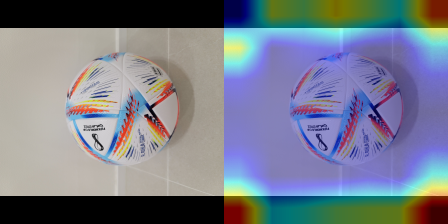


	Positive (Sketch) Images
	Reg num: DM215514(M001)


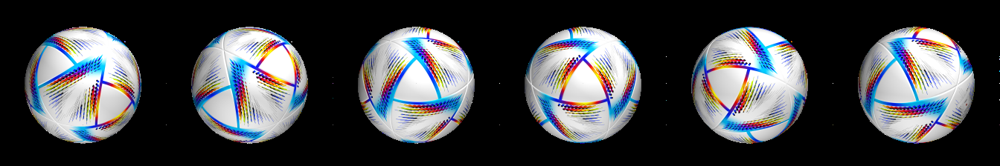

['sim: 0.777', 'sim: 0.791', 'sim: 0.797', 'sim: 0.794', 'sim: 0.778', 'sim: 0.812']

					Predicted Images
					   Grad CAM



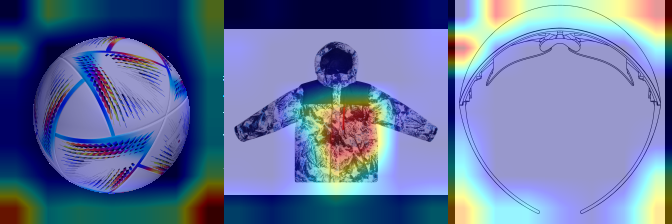

	cos_sim:0.812 			cos_sim:0.759 			cos_sim:0.736
pred_reg_num: DM215514(M001) 	pred_reg_num: 3011516920000 	pred_reg_num: 3010448610000


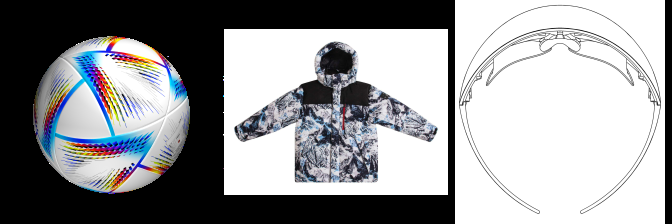


	Input Image
	Reg num: 3005904250000


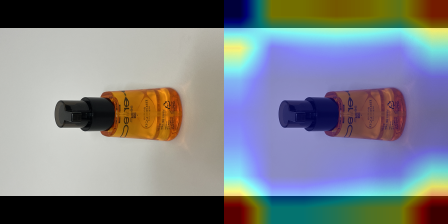


	Positive (Sketch) Images
	Reg num: 3005904250000


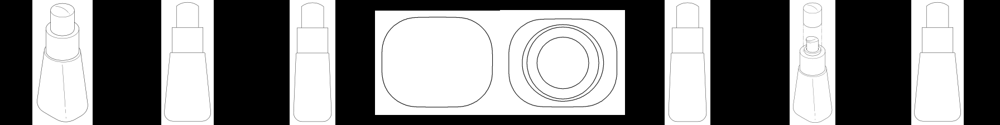

['sim: 0.638', 'sim: 0.542', 'sim: 0.595', 'sim: 0.691', 'sim: 0.644', 'sim: 0.595', 'sim: 0.642', 'sim: 0.542']

					Predicted Images
					   Grad CAM



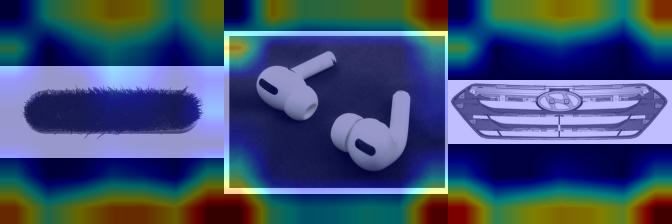

	cos_sim:0.797 			cos_sim:0.791 			cos_sim:0.781
pred_reg_num: 3009634810000 	pred_reg_num: 3010900050000 	pred_reg_num: 3006924390000


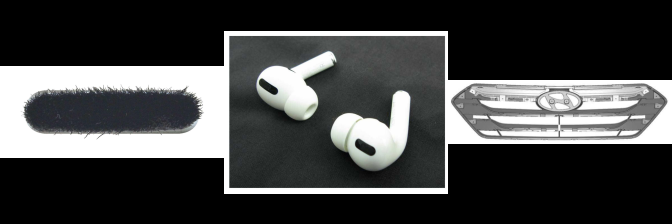


	Input Image
	Reg num: 3009746650000


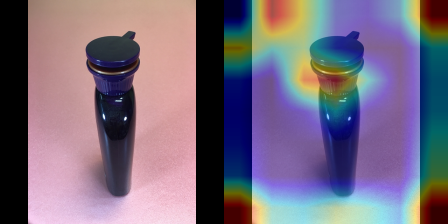


	Positive (Sketch) Images
	Reg num: 3009746650000


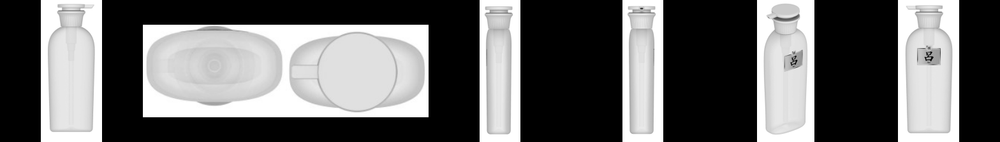

['sim: 0.438', 'sim: 0.709', 'sim: 0.676', 'sim: 0.679', 'sim: 0.658', 'sim: 0.648', 'sim: 0.469']

					Predicted Images
					   Grad CAM



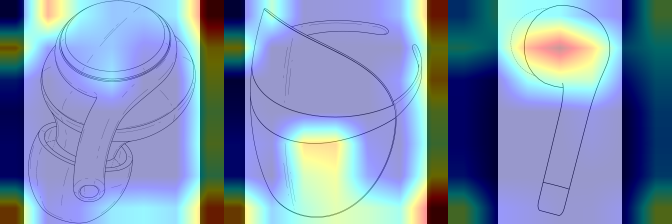

	cos_sim:0.920 			cos_sim:0.885 			cos_sim:0.837
pred_reg_num: 3009240880000 	pred_reg_num: 3010448610000 	pred_reg_num: 3008346600000


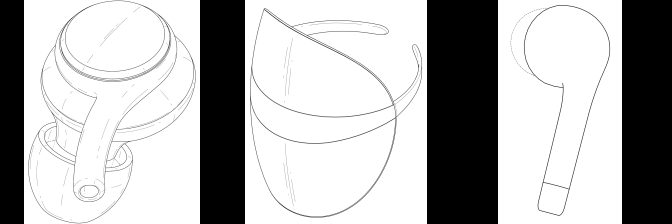


	Input Image
	Reg num: 3010031150000


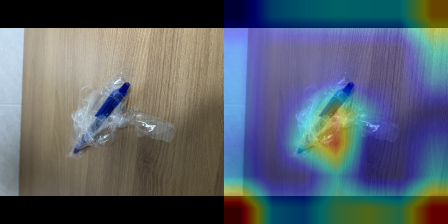


	Positive (Sketch) Images
	Reg num: 3010031150000


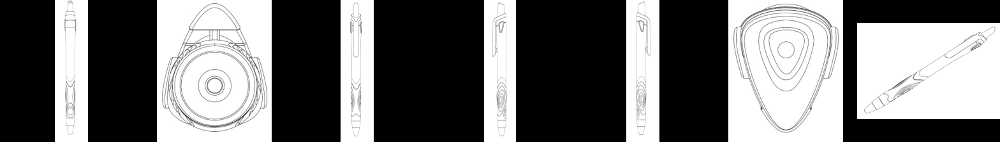

['sim: 0.451', 'sim: 0.297', 'sim: 0.514', 'sim: 0.383', 'sim: 0.276', 'sim: 0.514', 'sim: 0.327']

					Predicted Images
					   Grad CAM



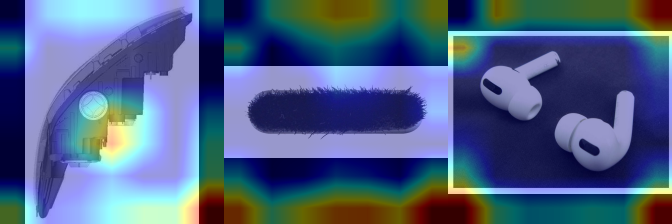

	cos_sim:0.633 			cos_sim:0.616 			cos_sim:0.606
pred_reg_num: 3008337320000 	pred_reg_num: 3009634810000 	pred_reg_num: 3010900050000


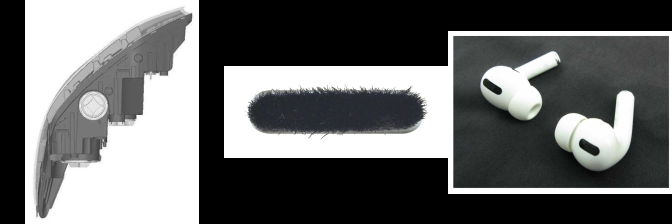


	Input Image
	Reg num: 3009462960000


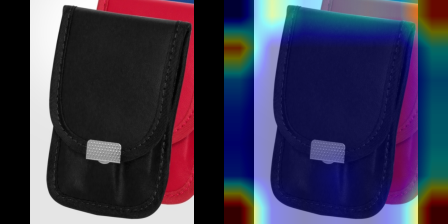


	Positive (Sketch) Images
	Reg num: 3009462960000


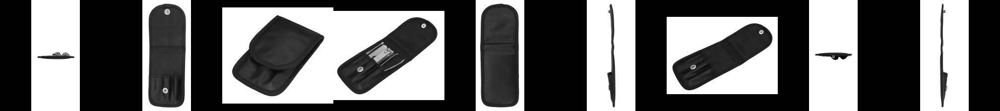

['sim: 0.608', 'sim: 0.732', 'sim: 0.719', 'sim: 0.704', 'sim: 0.704', 'sim: 0.700', 'sim: 0.702', 'sim: 0.493', 'sim: 0.644']

					Predicted Images
					   Grad CAM



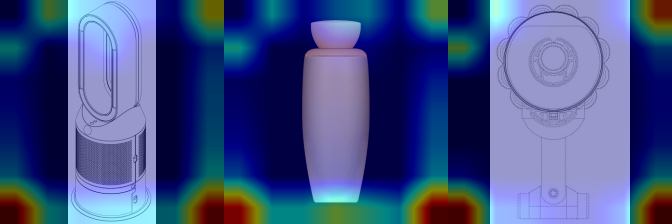

	cos_sim:0.884 			cos_sim:0.856 			cos_sim:0.848
pred_reg_num: 3010537670000 	pred_reg_num: 3005222300000 	pred_reg_num: 3010424520002


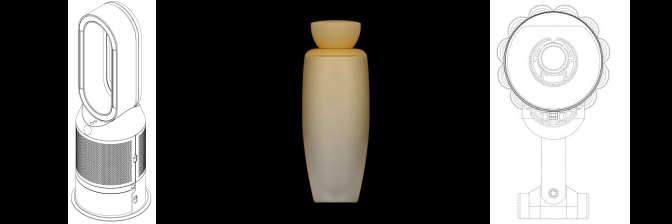


	Input Image
	Reg num: 3008346600000


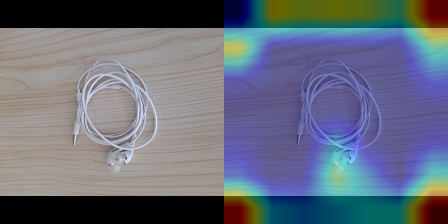


	Positive (Sketch) Images
	Reg num: 3008346600000


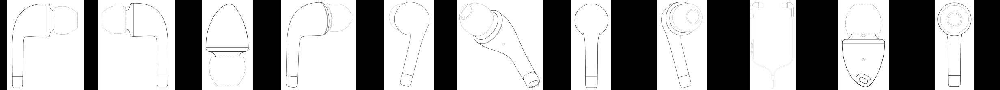

['sim: 0.507', 'sim: 0.428', 'sim: 0.468', 'sim: 0.605', 'sim: 0.730', 'sim: 0.646', 'sim: 0.726', 'sim: 0.741', 'sim: 0.583', 'sim: 0.582', 'sim: 0.768']

					Predicted Images
					   Grad CAM



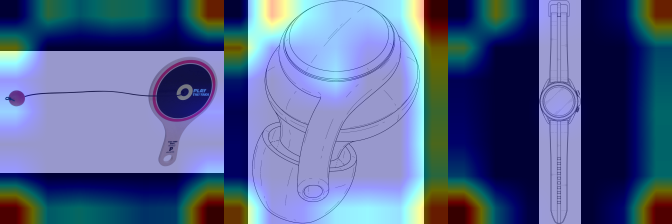

	cos_sim:0.844 			cos_sim:0.745 			cos_sim:0.734
pred_reg_num: 3011063150000 	pred_reg_num: 3009240880000 	pred_reg_num: 3010963450000


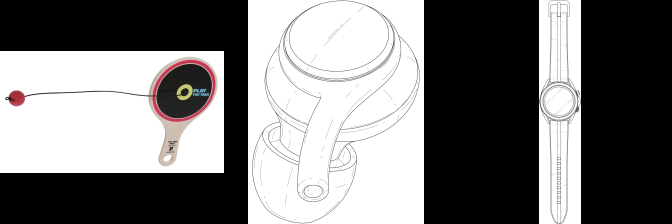


	Input Image
	Reg num: 3008486270000


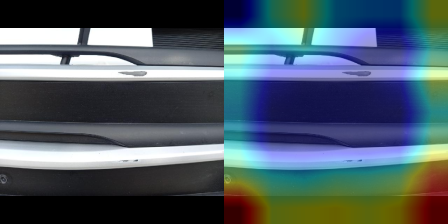


	Positive (Sketch) Images
	Reg num: 3008486270000


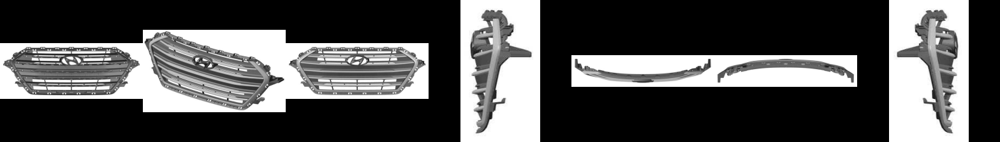

['sim: 0.681', 'sim: 0.758', 'sim: 0.688', 'sim: 0.721', 'sim: 0.846', 'sim: 0.745', 'sim: 0.705']

					Predicted Images
					   Grad CAM



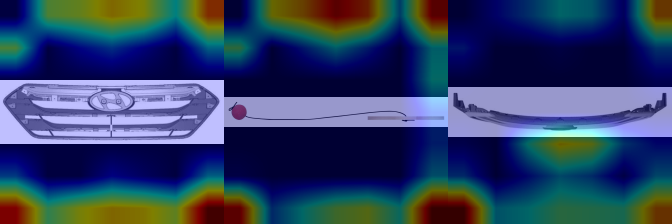

	cos_sim:0.880 			cos_sim:0.846 			cos_sim:0.846
pred_reg_num: 3006924390000 	pred_reg_num: 3011063150000 	pred_reg_num: 3008486270000


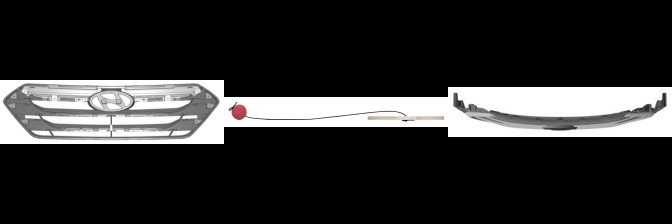


	Input Image
	Reg num: 3005222300000


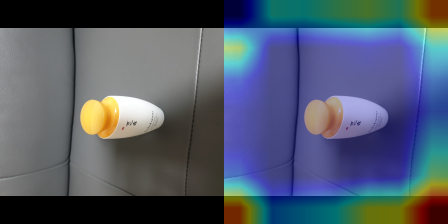


	Positive (Sketch) Images
	Reg num: 3005222300000


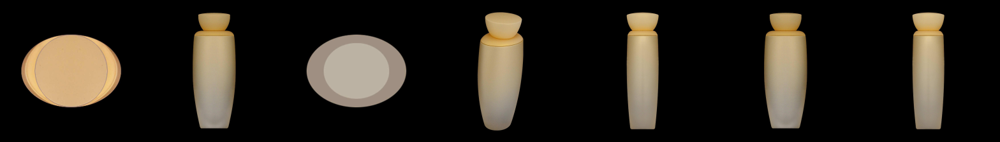

['sim: 0.684', 'sim: 0.706', 'sim: 0.606', 'sim: 0.681', 'sim: 0.639', 'sim: 0.706', 'sim: 0.639']

					Predicted Images
					   Grad CAM



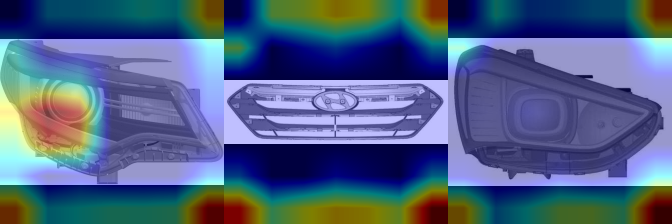

	cos_sim:0.858 			cos_sim:0.816 			cos_sim:0.798
pred_reg_num: 3008091660000 	pred_reg_num: 3006924390000 	pred_reg_num: 3006880340000


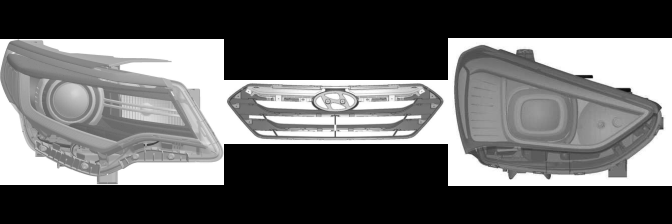


	Input Image
	Reg num: DM213531(M002)


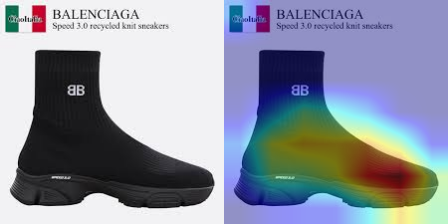


	Positive (Sketch) Images
	Reg num: DM213531(M002)


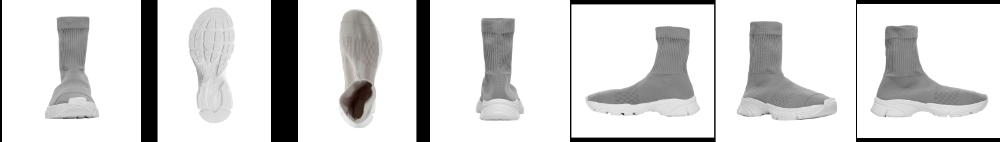

['sim: 0.617', 'sim: 0.747', 'sim: 0.825', 'sim: 0.642', 'sim: 0.974', 'sim: 0.957', 'sim: 0.968']

					Predicted Images
					   Grad CAM



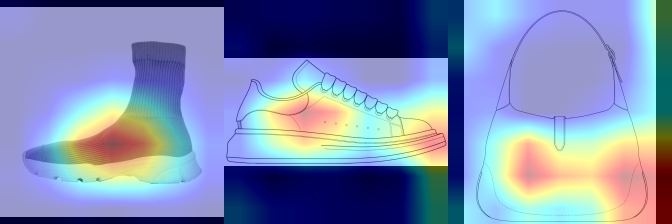

	cos_sim:0.974 			cos_sim:0.920 			cos_sim:0.890
pred_reg_num: DM213531(M002) 	pred_reg_num: DM089573(M001) 	pred_reg_num: 3004410640000


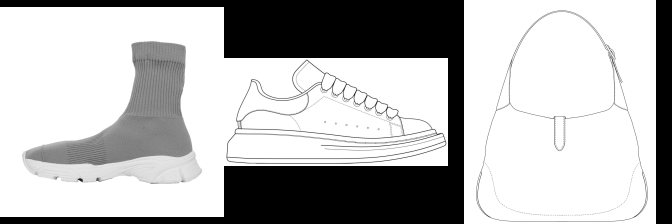


	Input Image
	Reg num: 3009240880000


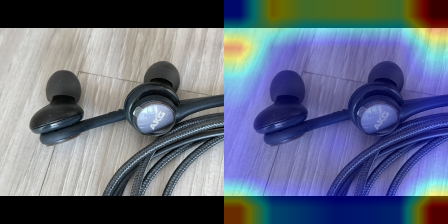


	Positive (Sketch) Images
	Reg num: 3009240880000


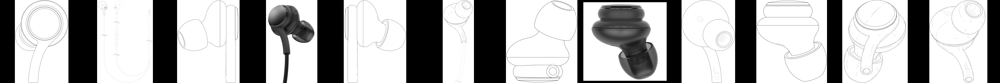

['sim: 0.838', 'sim: 0.689', 'sim: 0.713', 'sim: 0.863', 'sim: 0.706', 'sim: 0.756', 'sim: 0.618', 'sim: 0.707', 'sim: 0.815', 'sim: 0.632', 'sim: 0.745', 'sim: 0.836']

					Predicted Images
					   Grad CAM



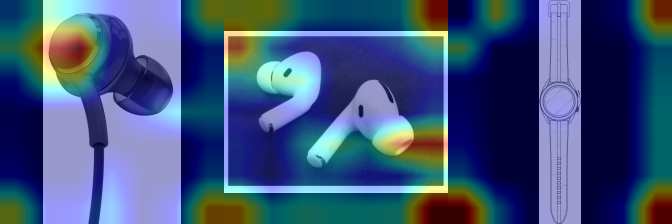

	cos_sim:0.863 			cos_sim:0.839 			cos_sim:0.824
pred_reg_num: 3009240880000 	pred_reg_num: 3010900050000 	pred_reg_num: 3010963450000


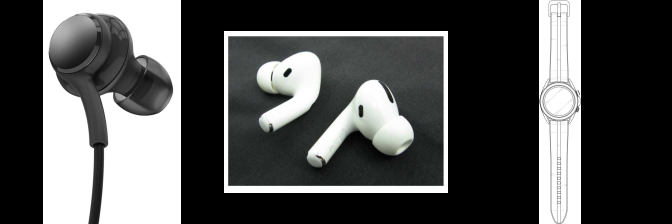

In [5]:
cos = torch.nn.CosineSimilarity(dim=1, eps=1e-6)
fms_ims_all = results['fms_ims_all']
fms_poss_all = results['fms_poss_all']
fms_negs_all = results['fms_negs_all']
ims = results['ims']
all_classes = results['classes_all']
poss = results['poss']
negs = results['negs']
indices_all = results["topk_inds"]
values_all = results["top_vals"]
classes_all = results["top_r_list"]

sk_dic = {}
sk = ds.sketch_lst
reg_nums = ds.prod_idx.keys()
for reg in reg_nums:
    to_del = []
    for s in sk:
        if reg in s:
            to_del.append(s)
    sk_dic[reg] = to_del

cnt = 0

m.to(device)
m.eval()
cam = GradCAM(model=m, target_layers=[m.conv_head], use_cuda=True)


for i, im in enumerate(ims):
    if i == 10:
        break
    print('\n\tInput Image')
    print(f"\tReg num: {idx_to_clss[all_classes[i].item()]}")
    im_fm = get_fm(m.forward_features(im.unsqueeze(0).to(device)))
    grayscale_cam = cam(input_tensor=im.unsqueeze(0).to(device))
    grayscale_cam = grayscale_cam[0, :]
    visualization = show_cam_on_image((ims[i]*255).cpu().numpy().transpose([1,2,0]).astype(np.uint8)/255, grayscale_cam, image_weight=0.6, use_rgb = True)
    ori_im = (ims[i]*255).cpu().numpy().transpose([1,2,0]).astype(np.uint8)
    
    
    display(Image.fromarray(np.concatenate([ori_im,visualization], axis=1)))
    print('\n\tPositive (Sketch) Images')
    print(f"\tReg num: {idx_to_clss[all_classes[i].item()]}")
    immssss = []
    to_disp = []
    coss = []
    for item, path in sk_dic.items():
        if idx_to_clss[all_classes[i].item()] == item:
            immssss.append(path)
    for k, sk in enumerate(immssss):
        for s in sk:        
            img = Image.open(s).convert("RGB")
            t = transforms.ToTensor()
            img_t = t(img)
            img_t_fm = get_fm(m.forward_features(img_t.unsqueeze(0).to(device)))
            
            
            # coss.append(f"cos_sim: {cos(im_fm, img_t_fm).item():.3f}")
            coss.append(f"sim: {cos(im_fm, img_t_fm).item():.3f}")
            to_disp.append(img)
    display(Image.fromarray(np.concatenate(to_disp, axis=1)))   
    print(coss)
    cnt += 1

    img_list = []
    img_list_gt = []
    pil_visualization = []
    for j in indices_all[i][:15]:
        img = (poss[j]*255).cpu().numpy().transpose([1,2,0]).astype(np.uint8)
        img_list.append(img)
        oris = poss[j]
        ori_cam = ((oris)*255).cpu().numpy().transpose([1,2,0]).astype(np.uint8) / 255
        grayscale_cam = cam(input_tensor=oris.unsqueeze(0))
        grayscale_cam = grayscale_cam[0, :]
        visualization = show_cam_on_image(ori_cam, grayscale_cam, image_weight=0.6, use_rgb = True)
        pil_visualization.append(visualization)
    print('\n\t\t\t\t\tPredicted Images')
    print('\t\t\t\t\t   Grad CAM\n')
    display(Image.fromarray(cv2.hconcat(pil_visualization)))
        
    if len(values_all[i]) < 3:
        pass
    else:
        print(f'\tcos_sim:{values_all[i][0]:.3f} \t\t\tcos_sim:{values_all[i][1]:.3f} \t\t\tcos_sim:{values_all[i][2]:.3f}')
        print(f'pred_reg_num: {idx_to_clss[classes_all[i][0]]} \tpred_reg_num: {idx_to_clss[classes_all[i][1]]} \tpred_reg_num: {idx_to_clss[classes_all[i][2]]}')
    display(Image.fromarray(np.concatenate(img_list, axis=1)))

# Inference with Spec72 Dataset (class based accuracy)

In [6]:
def get_fm(fm):
        pool = AvgPool2d((fm.shape[2],fm.shape[3]))
        return torch.reshape(pool(fm), (-1, fm.shape[1]))

def get_dl(path, bs, random = True, trainval_json="", trainval="val"):        
    
    ''' 
    Get path to the images and returns dataloader with transformations applied
    Arguments:

    path - path to the dir with images;
    bs - batch_size;
    random - if False loads train test split json file else randomly mix dataset.      

    '''
    
    transformations = {}   

    transformations['qry'] = transforms.Compose([
                            transforms.Resize((224,224)),
                            # transforms.RandomHorizontalFlip(),
                            # transforms.RandomRotation(90, fill = fill),
                            # transforms.ColorJitter([0.3, 1]),
                            # transforms.GaussianBlur(9, (0.5, 3.0)),
                            # AutoAugment.ImageNetPolicy(),
                            transforms.ToTensor(),
                                                  ])

    transformations['pos'] = transforms.Compose([
        transforms.Resize((224,224)),
        # AutoAugment.ImageNetPolicy(),
        # transforms.RandomRotation(90, fill = fill_sketch),
        # transforms.RandomPerspective(distortion_scale = distortion_scale, p = p, fill = fill_sketch),
        transforms.ToTensor(),
    ])  
    transformations['neg'] = transforms.Compose([
        transforms.Resize((224,224)),
        # AutoAugment.ImageNetPolicy(),
        # transforms.RandomRotation(90, fill = fill_sketch),
        # transforms.RandomPerspective(distortion_scale = distortion_scale, p = p, fill = fill_sketch),
        transforms.ToTensor(),
    ])
    
    # out_path = "data/sketchy_database_256_soft_split_cat.json"
    out_path = "data/spec72.json"
    # out_path = data_split(path, out_path)

    # tr_ds = SketchyImageDataset(data_dir = path, transform_dic=transformations, random=True, trainval_json=out_path, trainval='train', load_images=False)
    # val_ds = SketchyImageDataset(data_dir = path, transform_dic=transformations, random=True, trainval_json=out_path, trainval='val', load_images=False)
    # dataset = SketchyImageDataset(data_dir = path, transform_dic=transformations, random=True, trainval_json=out_path, trainval='test', load_images=False)
    dataset = OriginalImageDataset(data_dir = path, transform_dic=transformations, random=True, trainval_json=out_path, trainval=trainval, load_images=False)
    ds = OriginalDataset(data_dir = path, random=True, trainval_json=out_path, trainval=trainval)
    
    transformations = {}   

    transformations['qry'] = transforms.Compose([transforms.ToTensor()])
    transformations['pos'] = transforms.Compose([transforms.ToTensor()])
    transformations['neg'] = transforms.Compose([transforms.ToTensor()])
    
    # dataset = OriginalImageDataset(data_dir = path, transform_dic=transformations, random=True, load_images=False)
    num_classes = dataset.get_prod_length()
    print(f"The dataset has {num_classes} classes")    
    print(f"Number of test samples: {len(dataset)}")
    
    test_dl = DataLoader(dataset, batch_size=bs, shuffle=True, drop_last=True, num_workers=8)

    return num_classes, dataset, test_dl, ds


def load_checkpoint(checkpoint_path, model_name, pretrained=False, num_classes=None, from_pytorch_lightning=True, init_conv=False):

        ''' 
        
        Loads checkpoint_path from the given path to the directory with the trained model.
        Arguments:
        
        checkpoint_path - path to the dir with the trained model;
        model_name - name of the trained model (name is the same as in the timm library);
        pretrained - creates a model with pretrained weights on ImageNet;
        init_conv - initial convolution layer, default is True;
        from_pytorch_lightning - used to load the trained model from pytorch_lightning.
        If True the model is trained using pytorch_lightning, else with a regular torch library;
        Default is False
        
        '''        
        assert num_classes is not None, "Please set the number of classes in the dataset!"
        
        if from_pytorch_lightning: # for a pytorch_lightning model
            checkpoint = torch.load(checkpoint_path, map_location=device)
            # print(checkpoint['state_dict'].keys())
            if init_conv:                
                base_model = timm.create_model(model_name, pretrained=True, num_classes=num_classes)
                conv_layer = torch.nn.Sequential(torch.nn.Conv2d(3, 3, kernel_size=(3, 3), stride=(1, 1),padding=(1,1), bias=False), 
                 # nn.Conv2d(3, 3, kernel_size=(3, 3), stride=(2, 2),padding=(1,1), bias=False), 
                 # nn.MaxPool2d(kernel_size=(3,3), stride=(2,2), padding=(1,1)),
                 torch.nn.SiLU(inplace=True))
                model = torch.nn.Sequential(conv_layer, base_model) 
                print("Model with init_conv True")
            else:
                model = timm.create_model(model_name, num_classes=num_classes)
                # model.head.fc = Identity()
                print("Model with init_conv False")

            # create new OrderedDict that does not contain `model.` (for the checkpoint from the pytorch_lightning)
            new_state_dict = OD()
            for k, v in checkpoint['state_dict'].items():
                name = k.replace("model.", "") # remove `model.`
                new_state_dict[name] = v
            # load params
            model.load_state_dict(new_state_dict, strict=True)
            print(f"Model {model_name} trained using pytorch lightning checkpoint is successfully loaded!")

        else: # for a regular torch model  
            if pretrained:
                model = timm.create_model(model_name, num_classes=num_classes)
                print(f"Model {model_name} with pretrained weights is successfully loaded!")
            else:
                model = timm.create_model("rexnet_150", num_classes=num_classes)
                state_dict = torch.load(checkpoint_path, map_location=device)
                model.load_state_dict(state_dict)
                # num_features = model.head.fc.in_features
                # model.classifier = Linear(num_features, num_classes) if num_classes > 0 else Identity() 
                print(f"Model {model_name} with the best weights is successfully loaded!")            

        return model
    
def inference(model, dataloader, device):

        ''' 
        
        Inference using trained model and test dataloader.
        Arguments:
        
        model - trained model from the checkpoint (see load_checkpoint function);
        dataloader - test dataloader (see get_dl function);
        device - gpu device.
        
        '''   
        
        ims, poss, negs, pos_scores, neg_scores, fms_ims_all, top_vals, scores, fms_poss_all, fms_negs_all,  classes_all, top_inds, top_r_list, pred_lbls_all = [], [], [], [], [], [], [], [], [], [], [], [], [], []
        cos = torch.nn.CosineSimilarity(dim=1, eps=1e-6)
        model.to(device)
        model.eval()
        model.head = Identity()
        
        print("Obtaining embeddings...")        
        for i, batch_all in tqdm(enumerate(dataloader)):
            # if i == 1:
            #     break
            ims_all, poss_all, negs_all, clss_all, regs_all = batch_all['qry'], batch_all['pos'][0], batch_all['neg'][0], batch_all['cat_idx'], batch_all['prod_idx']
            ims.extend(ims_all)
            poss.extend(poss_all)
            negs.extend(negs_all)
            classes_all.extend(clss_all.to(device)) 
            
            with torch.no_grad():
                
                # with torch.cuda.amp.autocast():
                fm_ims_all = model.forward_features(ims_all.to(device))            
                # lbl_ims_all = model.head(fm_ims_all)
                fm_poss_all = model.forward_features(poss_all.to(device))
                # lbl_poss_all = model.head(fm_poss_all)
                fm_negs_all = model.forward_features(negs_all.to(device))
                # lbl_negs_all = model.head(fm_negs_all)
                fm_ims_all = get_fm(fm_ims_all)
                fm_poss_all = get_fm(fm_poss_all)
                fm_negs_all = get_fm(fm_negs_all)
                fms_ims_all.extend(fm_ims_all) #bs, fm 
                fms_poss_all.extend(fm_poss_all)
                fms_negs_all.extend(fm_negs_all)

        print("Embeddings are obtained!")        
        print("Calculating metrics...")
        top1 = 0 
        top3 = 0
        fms_ims_all = torch.stack(fms_ims_all) 
        fms_poss_all = torch.stack(fms_poss_all)
        fms_negs_all = torch.stack(fms_negs_all)        
        ims = torch.stack(ims)
        poss = torch.stack(poss)        
        negs = torch.stack(negs)        
        classes_all = torch.stack(classes_all)
        
        
        for idx, (gt_reg, fm) in enumerate(zip(classes_all, fms_ims_all)):
            pos_score = cos(fm.unsqueeze(0), fms_poss_all[idx].unsqueeze(0)) #(len(dl))
            pos_scores.append(pos_score.item())
            neg_score = cos(fm.unsqueeze(0), fms_negs_all[idx].unsqueeze(0)) #(len(dl))
            neg_scores.append(neg_score.item())
            # print(f"\nCosine similarity of a qry image with the corresponding pos sketch image: {pos_score.item():.3f}")
            # print(f"Cosine similarity of a qry image with the corresponding neg sketch image: {neg_score.item():.3f}")
            vals, inds = torch.topk(cos(fm, fms_poss_all), k=100)
            
            classes = [int(classes_all[int(ind)]) for ind in inds]
            top_i, top_v, top_r, top_c = [], [], [], []
            
            for num, (i, v, r) in enumerate(zip(inds, vals, classes)):
                if r not in top_r:
                    top_r.append(r)
                    top_v.append(v)
                    top_i.append(int(i))
                if len(top_r) == 3:
                    break
            top3 += 1 if int(gt_reg) in top_r else 0
            top1 += 1 if int(gt_reg) == top_r[0] else 0
            
            top_inds.append(top_i)
            top_vals.append(top_v)
            top_r_list.append(top_r)        
            
        return OD([('top1', top1/len(fms_ims_all)), ('top3', top3/len(fms_ims_all)), ('scores', torch.mean(torch.FloatTensor(pos_scores))),
                    ('fms_ims_all', fms_ims_all), ('classes_all', classes_all), ('fms_poss_all', fms_poss_all),
                    ('ims', ims), ('poss', poss), ('negs', negs), ('fms_negs_all', fms_negs_all),
                    ('topk_inds_reg', top_r_list), ('topk_inds', top_inds), ('top_vals', top_vals), ('top_r_list', top_r_list)])

In [7]:
path = "/home/ubuntu/workspace/dataset/test_dataset_svg/spec72"
bs=32
device='cuda:0'
num_classes, test_ds, test_dl, ds = get_dl(path=path, bs=bs, trainval='test')
idx_to_clss = {v:k for k,v in test_ds.cat_idx.items()}
checkpoint_path = "/home/ubuntu/workspace/bekhzod/pytorch_lightning/saved_models/efficientnet_b3a_Adam_0.0047863/Sketchy-Dataset-Training/3jdu9op8/checkpoints/epoch=32-val_loss=0.27-cos_sims=0.94-val_top1=0.95.ckpt"
m = load_checkpoint(checkpoint_path, num_classes=125, from_pytorch_lightning=True, model_name='efficientnet_b3a')
results = inference(m, test_dl, device)
results['top3'], results['top1'], results['scores']

The dataset has 72 classes
Number of test samples: 537
Model with init_conv False
Model efficientnet_b3a trained using pytorch lightning checkpoint is successfully loaded!
Obtaining embeddings...


16it [00:03,  4.23it/s]


Embeddings are obtained!
Calculating metrics...


(0.380859375, 0.20703125, tensor(0.6518))


	Input Image
	Reg num: G22913


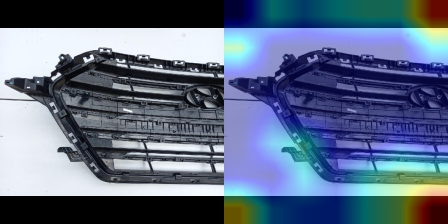


	Positive (Sketch) Images
	Reg num: G22913


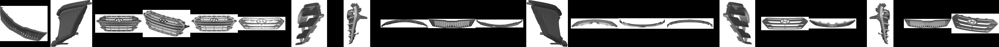

['sim: 0.450', 'sim: 0.317', 'sim: 0.506', 'sim: 0.688', 'sim: 0.586', 'sim: 0.714', 'sim: 0.685', 'sim: 0.805', 'sim: 0.676', 'sim: 0.532', 'sim: 0.705', 'sim: 0.377', 'sim: 0.499', 'sim: 0.705', 'sim: 0.535', 'sim: 0.684', 'sim: 0.663', 'sim: 0.666', 'sim: 0.742', 'sim: 0.468', 'sim: 0.644']

					Predicted Images
					   Grad CAM



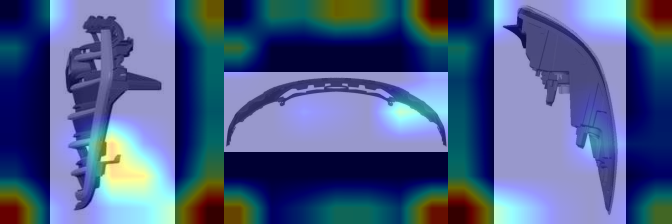

	cos_sim:0.805 			cos_sim:0.780 			cos_sim:0.776
pred_reg_num: G22913 	pred_reg_num: G22911BA 	pred_reg_num: D37111


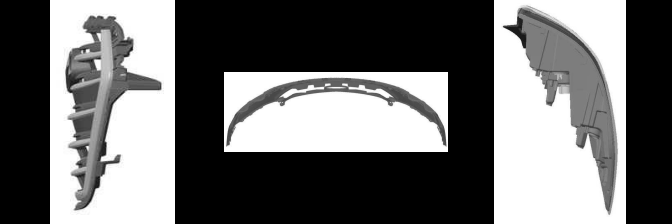


	Input Image
	Reg num: H540


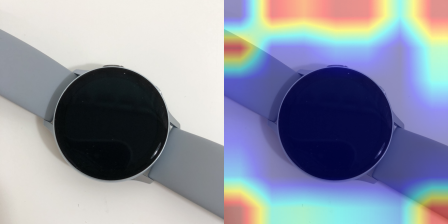


	Positive (Sketch) Images
	Reg num: H540


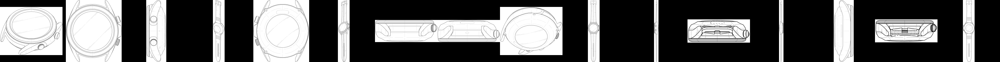

['sim: 0.728', 'sim: 0.812', 'sim: 0.699', 'sim: 0.711', 'sim: 0.816', 'sim: 0.682', 'sim: 0.702', 'sim: 0.726', 'sim: 0.771', 'sim: 0.747', 'sim: 0.500', 'sim: 0.729', 'sim: 0.486', 'sim: 0.637', 'sim: 0.665', 'sim: 0.732']

					Predicted Images
					   Grad CAM



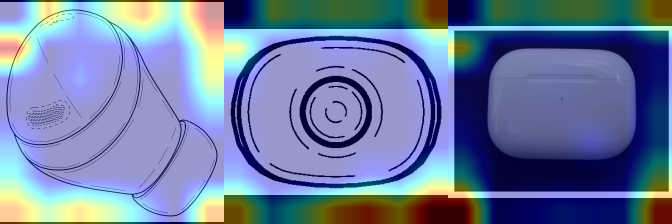

	cos_sim:0.921 			cos_sim:0.896 			cos_sim:0.893
pred_reg_num: H4143 	pred_reg_num: H592 	pred_reg_num: H4149


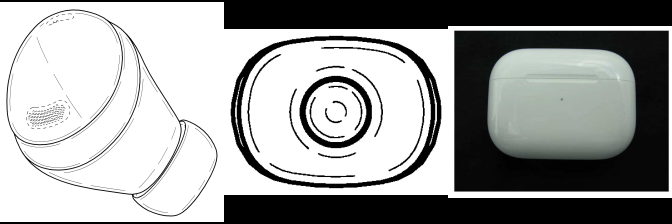


	Input Image
	Reg num: H4333B


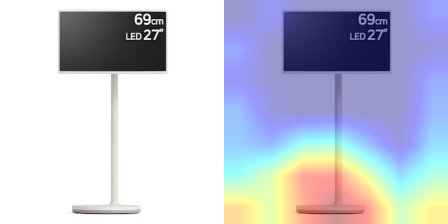


	Positive (Sketch) Images
	Reg num: H4333B


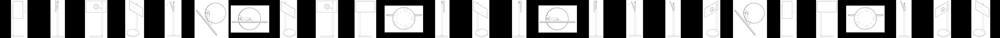

['sim: 0.732', 'sim: 0.845', 'sim: 0.699', 'sim: 0.851', 'sim: 0.863', 'sim: 0.531', 'sim: 0.520', 'sim: 0.787', 'sim: 0.699', 'sim: 0.734', 'sim: 0.527', 'sim: 0.835', 'sim: 0.787', 'sim: 0.835', 'sim: 0.520', 'sim: 0.845', 'sim: 0.863', 'sim: 0.856', 'sim: 0.638', 'sim: 0.531', 'sim: 0.732', 'sim: 0.734', 'sim: 0.527', 'sim: 0.856', 'sim: 0.638', 'sim: 0.851']

					Predicted Images
					   Grad CAM



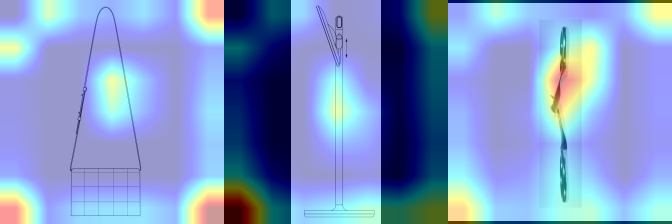

	cos_sim:0.889 			cos_sim:0.856 			cos_sim:0.829
pred_reg_num: B44AA 	pred_reg_num: H4333B 	pred_reg_num: K1130


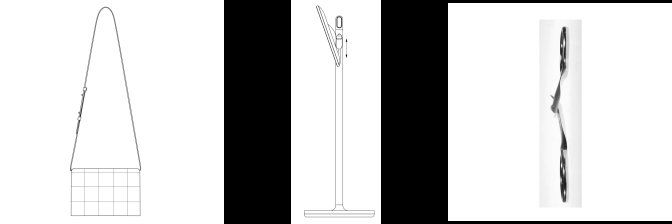


	Input Image
	Reg num: D37111


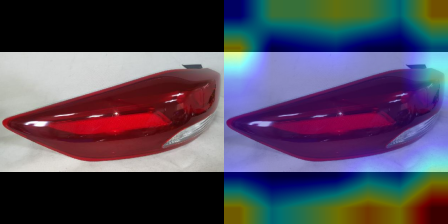


	Positive (Sketch) Images
	Reg num: D37111


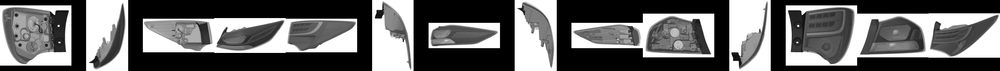

['sim: 0.619', 'sim: 0.643', 'sim: 0.612', 'sim: 0.824', 'sim: 0.711', 'sim: 0.595', 'sim: 0.735', 'sim: 0.576', 'sim: 0.731', 'sim: 0.512', 'sim: 0.499', 'sim: 0.462', 'sim: 0.656', 'sim: 0.779']

					Predicted Images
					   Grad CAM



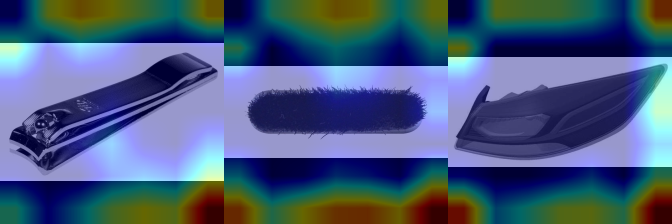

	cos_sim:0.849 			cos_sim:0.835 			cos_sim:0.824
pred_reg_num: B71410 	pred_reg_num: B7120 	pred_reg_num: D37111


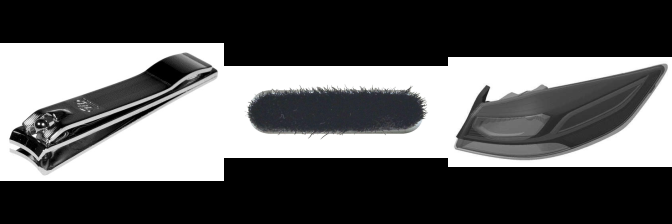


	Input Image
	Reg num: H4143


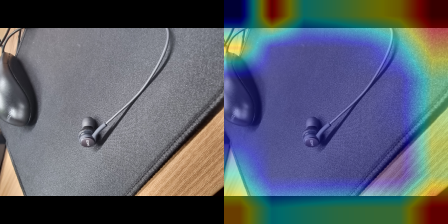


	Positive (Sketch) Images
	Reg num: H4143


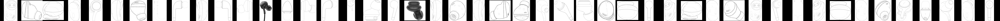

['sim: 0.417', 'sim: 0.547', 'sim: 0.502', 'sim: 0.473', 'sim: 0.635', 'sim: 0.525', 'sim: 0.467', 'sim: 0.661', 'sim: 0.720', 'sim: 0.544', 'sim: 0.614', 'sim: 0.601', 'sim: 0.600', 'sim: 0.401', 'sim: 0.621', 'sim: 0.604', 'sim: 0.580', 'sim: 0.436', 'sim: 0.607', 'sim: 0.468', 'sim: 0.594', 'sim: 0.575', 'sim: 0.519', 'sim: 0.452', 'sim: 0.498', 'sim: 0.657', 'sim: 0.618', 'sim: 0.501', 'sim: 0.457', 'sim: 0.449', 'sim: 0.579', 'sim: 0.500', 'sim: 0.515', 'sim: 0.533', 'sim: 0.617', 'sim: 0.421', 'sim: 0.604', 'sim: 0.577', 'sim: 0.522', 'sim: 0.449', 'sim: 0.484', 'sim: 0.483', 'sim: 0.627', 'sim: 0.481', 'sim: 0.558', 'sim: 0.455', 'sim: 0.615']

					Predicted Images
					   Grad CAM



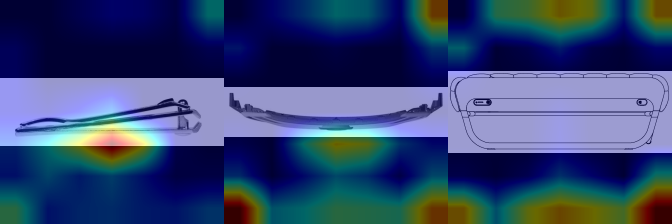

	cos_sim:0.817 			cos_sim:0.791 			cos_sim:0.772
pred_reg_num: B71410 	pred_reg_num: G22913 	pred_reg_num: J751


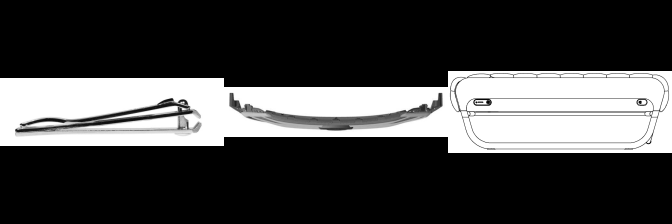


	Input Image
	Reg num: D37110


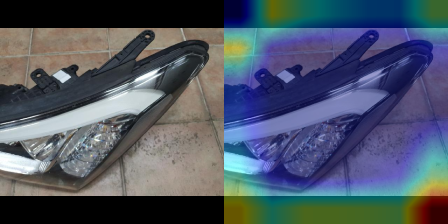


	Positive (Sketch) Images
	Reg num: D37110


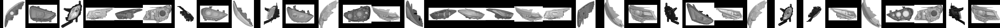

['sim: 0.708', 'sim: 0.705', 'sim: 0.641', 'sim: 0.644', 'sim: 0.741', 'sim: 0.664', 'sim: 0.582', 'sim: 0.742', 'sim: 0.685', 'sim: 0.661', 'sim: 0.736', 'sim: 0.657', 'sim: 0.717', 'sim: 0.742', 'sim: 0.733', 'sim: 0.502', 'sim: 0.699', 'sim: 0.790', 'sim: 0.742', 'sim: 0.644', 'sim: 0.553', 'sim: 0.653', 'sim: 0.733', 'sim: 0.502', 'sim: 0.803', 'sim: 0.672', 'sim: 0.657', 'sim: 0.513', 'sim: 0.726', 'sim: 0.672', 'sim: 0.653', 'sim: 0.712', 'sim: 0.664', 'sim: 0.675', 'sim: 0.733']

					Predicted Images
					   Grad CAM



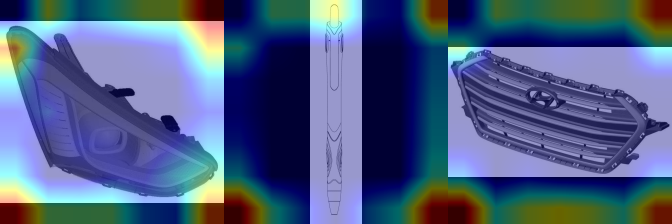

	cos_sim:0.803 			cos_sim:0.792 			cos_sim:0.782
pred_reg_num: D37110 	pred_reg_num: F21180AA 	pred_reg_num: G22913


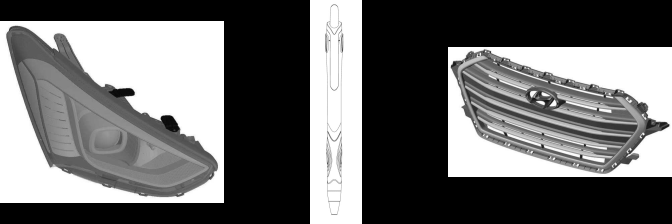


	Input Image
	Reg num: F4510A


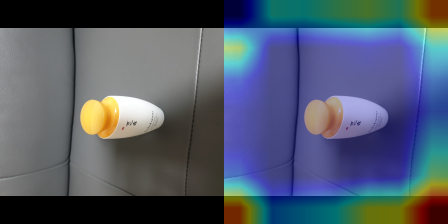


	Positive (Sketch) Images
	Reg num: F4510A


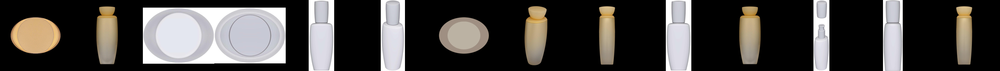

['sim: 0.684', 'sim: 0.706', 'sim: 0.721', 'sim: 0.721', 'sim: 0.614', 'sim: 0.756', 'sim: 0.606', 'sim: 0.681', 'sim: 0.639', 'sim: 0.614', 'sim: 0.706', 'sim: 0.643', 'sim: 0.519', 'sim: 0.639']

					Predicted Images
					   Grad CAM



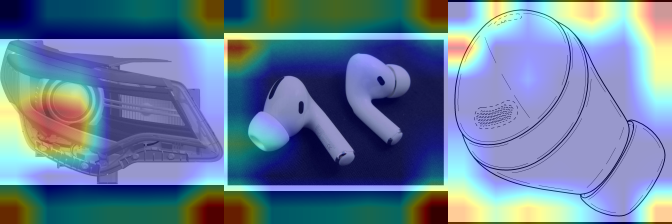

	cos_sim:0.858 			cos_sim:0.819 			cos_sim:0.798
pred_reg_num: D37110 	pred_reg_num: H4142 	pred_reg_num: H4143


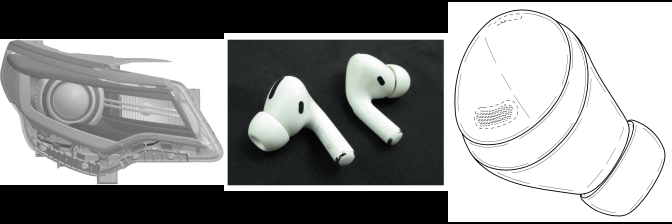


	Input Image
	Reg num: D37110


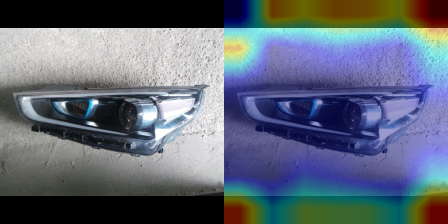


	Positive (Sketch) Images
	Reg num: D37110


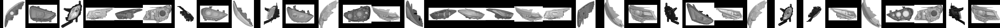

['sim: 0.688', 'sim: 0.752', 'sim: 0.695', 'sim: 0.671', 'sim: 0.807', 'sim: 0.690', 'sim: 0.574', 'sim: 0.764', 'sim: 0.613', 'sim: 0.591', 'sim: 0.690', 'sim: 0.689', 'sim: 0.715', 'sim: 0.758', 'sim: 0.817', 'sim: 0.474', 'sim: 0.689', 'sim: 0.740', 'sim: 0.758', 'sim: 0.671', 'sim: 0.623', 'sim: 0.655', 'sim: 0.710', 'sim: 0.549', 'sim: 0.745', 'sim: 0.677', 'sim: 0.689', 'sim: 0.487', 'sim: 0.741', 'sim: 0.677', 'sim: 0.655', 'sim: 0.723', 'sim: 0.690', 'sim: 0.607', 'sim: 0.710']

					Predicted Images
					   Grad CAM



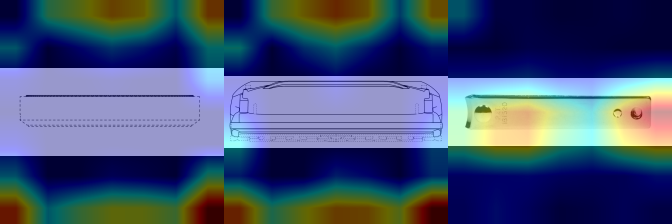

	cos_sim:0.888 			cos_sim:0.872 			cos_sim:0.865
pred_reg_num: H2212 	pred_reg_num: C3410E 	pred_reg_num: B71410


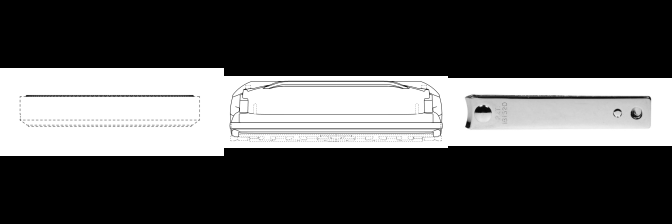


	Input Image
	Reg num: H4143


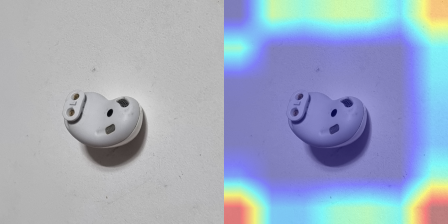


	Positive (Sketch) Images
	Reg num: H4143


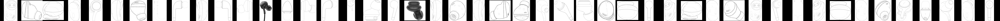

['sim: 0.612', 'sim: 0.695', 'sim: 0.740', 'sim: 0.723', 'sim: 0.548', 'sim: 0.736', 'sim: 0.700', 'sim: 0.765', 'sim: 0.635', 'sim: 0.677', 'sim: 0.666', 'sim: 0.635', 'sim: 0.489', 'sim: 0.666', 'sim: 0.622', 'sim: 0.745', 'sim: 0.588', 'sim: 0.541', 'sim: 0.517', 'sim: 0.691', 'sim: 0.641', 'sim: 0.762', 'sim: 0.742', 'sim: 0.744', 'sim: 0.764', 'sim: 0.525', 'sim: 0.702', 'sim: 0.642', 'sim: 0.751', 'sim: 0.682', 'sim: 0.488', 'sim: 0.733', 'sim: 0.740', 'sim: 0.805', 'sim: 0.813', 'sim: 0.630', 'sim: 0.505', 'sim: 0.583', 'sim: 0.754', 'sim: 0.686', 'sim: 0.781', 'sim: 0.707', 'sim: 0.715', 'sim: 0.734', 'sim: 0.513', 'sim: 0.723', 'sim: 0.665']

					Predicted Images
					   Grad CAM



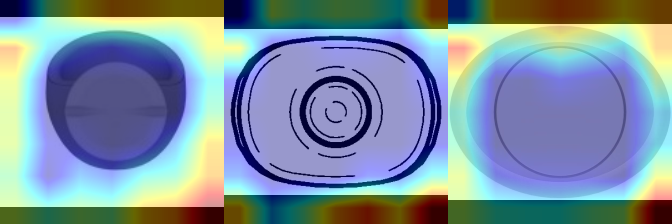

	cos_sim:0.841 			cos_sim:0.826 			cos_sim:0.814
pred_reg_num: B713 	pred_reg_num: H592 	pred_reg_num: F4510A


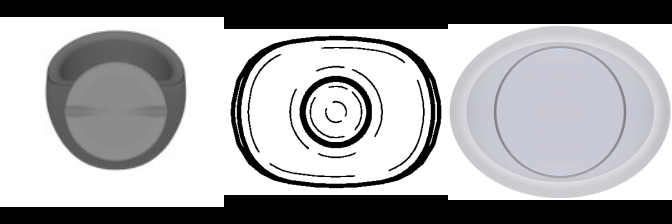


	Input Image
	Reg num: G22911BA


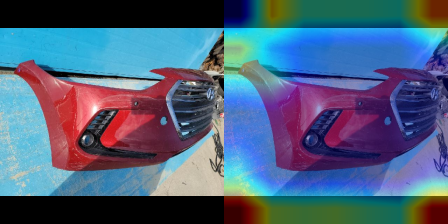


	Positive (Sketch) Images
	Reg num: G22911BA


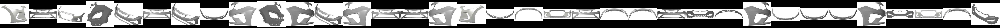

['sim: 0.717', 'sim: 0.551', 'sim: 0.686', 'sim: 0.678', 'sim: 0.586', 'sim: 0.663', 'sim: 0.586', 'sim: 0.606', 'sim: 0.707', 'sim: 0.673', 'sim: 0.726', 'sim: 0.586', 'sim: 0.707', 'sim: 0.663', 'sim: 0.551', 'sim: 0.707', 'sim: 0.742', 'sim: 0.658', 'sim: 0.614', 'sim: 0.735', 'sim: 0.663', 'sim: 0.628', 'sim: 0.628', 'sim: 0.551', 'sim: 0.643', 'sim: 0.555', 'sim: 0.726', 'sim: 0.620', 'sim: 0.606', 'sim: 0.606', 'sim: 0.726', 'sim: 0.660', 'sim: 0.731', 'sim: 0.628', 'sim: 0.632']

					Predicted Images
					   Grad CAM



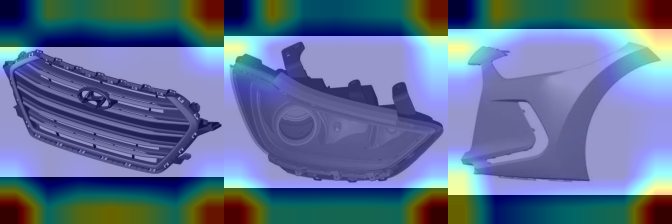

	cos_sim:0.753 			cos_sim:0.747 			cos_sim:0.742
pred_reg_num: G22913 	pred_reg_num: D37110 	pred_reg_num: G22911BA


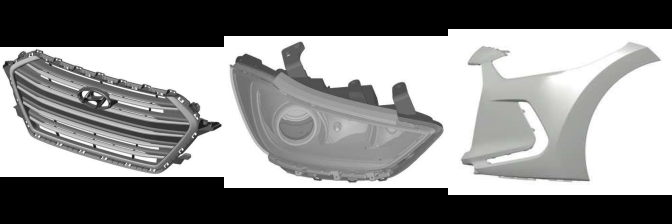

In [8]:
cos = torch.nn.CosineSimilarity(dim=1, eps=1e-6)
fms_ims_all = results['fms_ims_all']
fms_poss_all = results['fms_poss_all']
fms_negs_all = results['fms_negs_all']
ims = results['ims']
all_classes = results['classes_all']
poss = results['poss']
negs = results['negs']
indices_all = results["topk_inds"]
values_all = results["top_vals"]
classes_all = results["top_r_list"]

sk_dic = {}
sk = ds.sketch_lst
reg_nums = ds.cat_idx.keys()
for reg in reg_nums:
    to_del = []
    for s in sk:
        if reg in s:
            to_del.append(s)
    sk_dic[reg] = to_del

cnt = 0

m.to(device)
m.eval()
cam = GradCAM(model=m, target_layers=[m.conv_head], use_cuda=True)


for i, im in enumerate(ims):
    if i == 10:
        break
    print('\n\tInput Image')
    print(f"\tReg num: {idx_to_clss[all_classes[i].item()]}")
    im_fm = get_fm(m.forward_features(im.unsqueeze(0).to(device)))
    grayscale_cam = cam(input_tensor=im.unsqueeze(0).to(device))
    grayscale_cam = grayscale_cam[0, :]
    visualization = show_cam_on_image((ims[i]*255).cpu().numpy().transpose([1,2,0]).astype(np.uint8)/255, grayscale_cam, image_weight=0.6, use_rgb = True)
    ori_im = (ims[i]*255).cpu().numpy().transpose([1,2,0]).astype(np.uint8)
    
    
    display(Image.fromarray(np.concatenate([ori_im,visualization], axis=1)))
    print('\n\tPositive (Sketch) Images')
    print(f"\tReg num: {idx_to_clss[all_classes[i].item()]}")
    immssss = []
    to_disp = []
    coss = []
    for item, path in sk_dic.items():
        if idx_to_clss[all_classes[i].item()] == item:
            immssss.append(path)
    for k, sk in enumerate(immssss):
        for s in sk:        
            img = Image.open(s).convert("RGB")
            t = transforms.ToTensor()
            img_t = t(img)
            img_t_fm = get_fm(m.forward_features(img_t.unsqueeze(0).to(device)))            
            # coss.append(f"cos_sim: {cos(im_fm, img_t_fm).item():.3f}")
            coss.append(f"sim: {cos(im_fm, img_t_fm).item():.3f}")
            to_disp.append(img)
    display(Image.fromarray(np.concatenate(to_disp, axis=1)))   
    print(coss)
    cnt += 1

    img_list = []
    img_list_gt = []
    pil_visualization = []
    for j in indices_all[i][:15]:
        img = (poss[j]*255).cpu().numpy().transpose([1,2,0]).astype(np.uint8)
        img_list.append(img)
        oris = poss[j]
        ori_cam = ((oris)*255).cpu().numpy().transpose([1,2,0]).astype(np.uint8) / 255
        grayscale_cam = cam(input_tensor=oris.unsqueeze(0))
        grayscale_cam = grayscale_cam[0, :]
        visualization = show_cam_on_image(ori_cam, grayscale_cam, image_weight=0.6, use_rgb = True)
        pil_visualization.append(visualization)
    print('\n\t\t\t\t\tPredicted Images')
    print('\t\t\t\t\t   Grad CAM\n')
    display(Image.fromarray(cv2.hconcat(pil_visualization)))
        
    if len(values_all[i]) < 3:
        pass
    else:
        print(f'\tcos_sim:{values_all[i][0]:.3f} \t\t\tcos_sim:{values_all[i][1]:.3f} \t\t\tcos_sim:{values_all[i][2]:.3f}')
        print(f'pred_reg_num: {idx_to_clss[classes_all[i][0]]} \tpred_reg_num: {idx_to_clss[classes_all[i][1]]} \tpred_reg_num: {idx_to_clss[classes_all[i][2]]}')
    display(Image.fromarray(np.concatenate(img_list, axis=1)))